In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import os
import tensorflow
import keras

import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import (Activation, Dense, Dropout, Input, Reshape, Flatten, BatchNormalization)
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [3]:
img_input_size = 256
noise_size = 256 #100
EPOCHS = 600
BATCH_SIZE = 128

dataset_path = "D:\Datasets\Mutually_Exclusive_Images\Hernia"
filenames = os.listdir(dataset_path)
X_train = [] # Initialize an empty array to store the image data
for filename in filenames:
    # Load the image using the load_img function from Keras
    img = load_img(os.path.join(dataset_path, filename), color_mode = 'grayscale', target_size = (img_input_size, img_input_size))
    
    img_arr = img_to_array(img) # Convert the image to a NumPy array
    X_train.append(img_arr) # Append the image array to the X_train list

X_train = np.array(X_train) # Convert the list to a NumPy array
# Convert the pixel values to float and normalize the data between -1 and 1
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
# Reshape the data from (n_samples, height, width, n_channels) to (n_samples, n_features)
X_train = X_train.reshape(X_train.shape[0], -1)

In [4]:
def plot_images(epoch, generator, dim = (10, 10), figsize = (10, 10)):
    #generate a normally distributed noise of shape (100x100)
    #generate an image for the input noise
    noise = np.random.normal(loc = 0, scale = 1, size = [100, 100])
  
    generated_images = generator.predict(noise) #generate an image for the input noise    
    generated_images = generated_images.reshape(100, img_input_size, img_input_size) #reshape the generated image
    plt.figure(figsize = figsize) #plot the image
  
    #plot for each pixel  
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i + 1)
        plt.imshow(generated_images[i], cmap = 'gray', interpolation = 'nearest')
        plt.axis('off')
        plt.tight_layout()    

In [5]:
def build_generator():
    generator = Sequential()
    
    generator.add(Dense(units = 256, input_dim = 100))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum = 0.8))
    
#     generator.add(Dense(units = 512))
    
    generator.add(Dense(units = 1024))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum = 0.8))
    
    generator.add(Dense(units = img_input_size ** 2, activation = 'tanh'))
    
    generator.compile(
        loss = 'binary_crossentropy', 
        optimizer = tensorflow.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
    )
    return generator


def build_discriminator():
    discriminator = Sequential()
    
    discriminator.add(Dense(units = 1024, input_dim = img_input_size ** 2))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.2))
    
    discriminator.add(Dense(units = 512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    
    discriminator.add(Dense(units = 256))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
  
    discriminator.add(Dense(units = 128))
    discriminator.add(LeakyReLU(0.2))
  
    discriminator.add(Dense(units = 1, activation = 'sigmoid'))
  
    discriminator.compile(
        loss = 'binary_crossentropy',
        optimizer = tensorflow.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
    )
    return discriminator


#stacking the generator and discriminator networks to form a GAN.
def gan_net(generator, discriminator):
    #setting the trainable parameter of discriminator or false.
    discriminator.trainable = False
    
    #instantiates a keras tensor of shape 100 (Noise shape)
    noise = Input(shape = (100, ))
    
    X = generator(noise)
    
    #feeds the output from generator (X) to the discriminator and stores the results in out
    discriminator_output = discriminator(X)
    
    #creates a model include all layers required in the computation of out given inputs
    gan = Model(noise, discriminator_output)
#     gan = Model(input=inp, outputs=out)

    gan.compile(loss = 'binary_crossentropy', optimizer = 'adam')
    return gan

In [6]:
discriminator_losses = []
gan_losses = []

#Training method with training set, default epoch and default batch_size as arguments
def train(X_train, epochs = 5, batch_size = 128):
    generator = build_generator()
    discriminator = build_discriminator()
    gan = gan_net(generator, discriminator)
    
    gan.summary()
    
    #training the model for specified epochs
    for epoch in range(1, epochs + 1):
        print(f"Epoch: {epoch}/{epochs}")
        
        for _ in tqdm(range(batch_size), ncols = 100):
            noise = np.random.normal(0, 1, [batch_size, 100]) #random noise with size batch_sizex100      
            generated_images = generator.predict(noise) #generating images from noise
            image_batch = X_train[np.random.randint(low = 0, high = X_train.shape[0], size = batch_size)] #taking random images from the training
            X = np.concatenate([image_batch, generated_images]) #creating a new training set with real and fake images
            y_dis = np.zeros(2 * batch_size) #labels for generated and real data
            y_dis[ : batch_size] = 1.0 #label for real images
            
            #training the discrminator with real and generated images
            discriminator.trainable = True
            d_loss = discriminator.train_on_batch(X, y_dis)
            if epoch % 20 == 0: 
                discriminator_losses.append(d_loss)
      
            #labelling the generated images a sreal images(1) to trick the discriminator
      
            noise = np.random.normal(0, 1, [batch_size, 100])
            y_gen = np.ones(batch_size)
      
            #freezing the weights of the discriminant while training generator
            discriminator.trainable = False
      
            #training the gan network
            gan_loss = gan.train_on_batch(noise, y_gen)
            if epoch % 20 == 0: 
                gan_losses.append(gan_loss)
            
            #plotting the images for every 10 epoch
            if epoch == 1 or epoch % 100 == 0:
                plot_images(epoch, generator, dim = (10, 10), figsize = (15, 15))

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential (Sequential)      (None, 65536)             67468544  
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 67799041  
Total params: 135,267,585
Trainable params: 67,465,984
Non-trainable params: 67,801,601
_________________________________________________________________
Epoch: 1/500


  4%|██▍                                                            | 5/128 [01:00<24:45, 12.07s/it]


KeyboardInterrupt: 

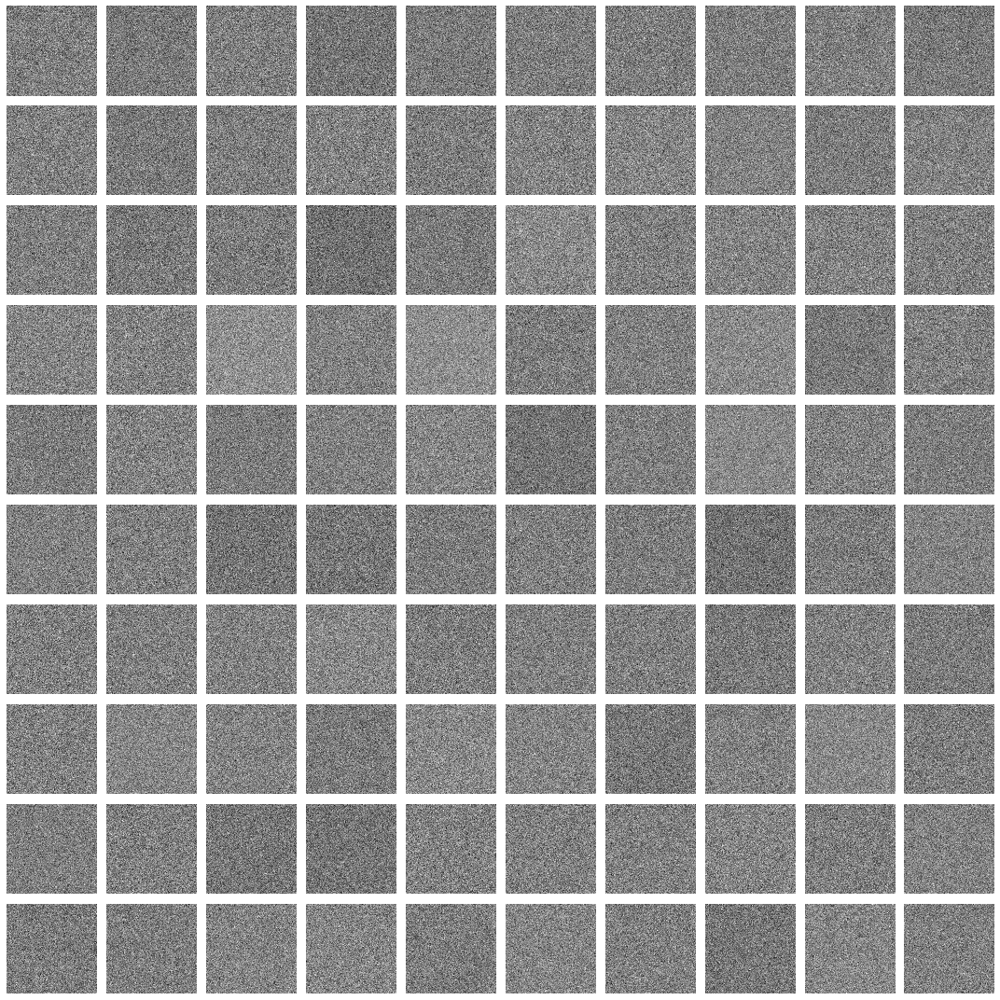

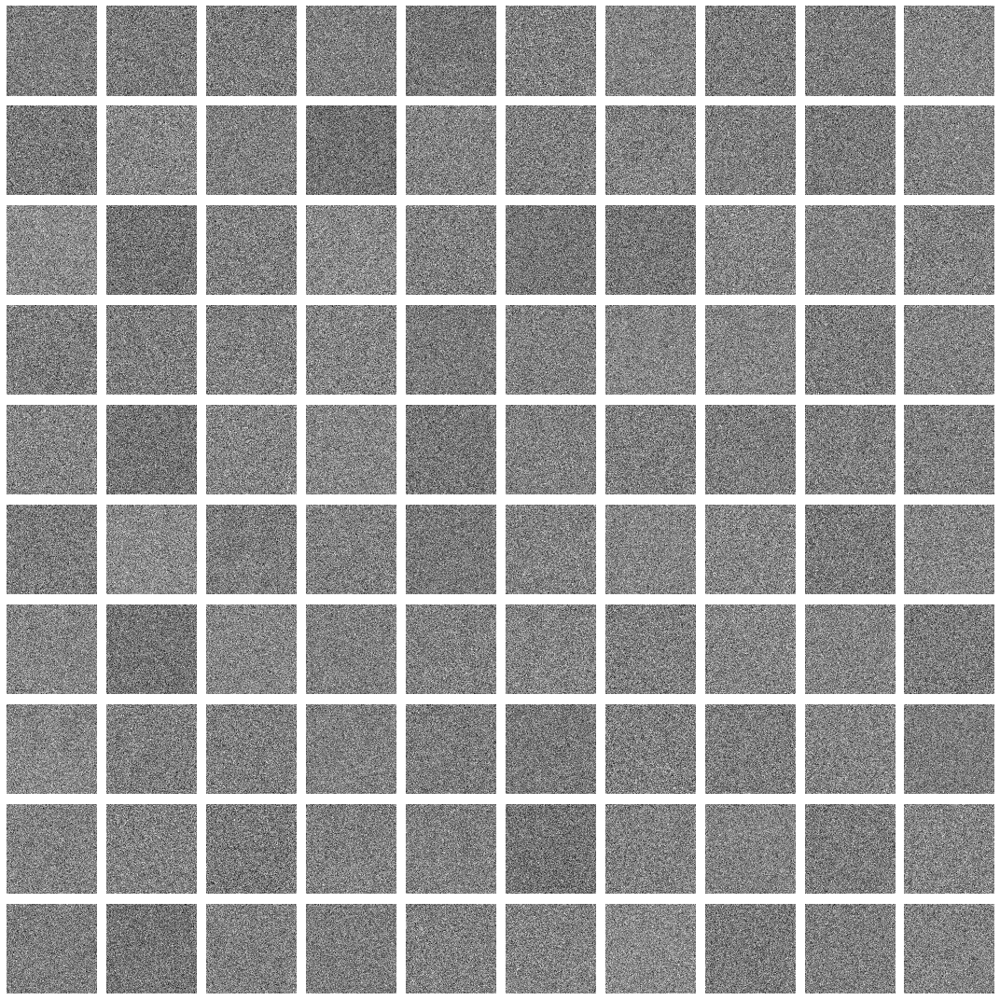

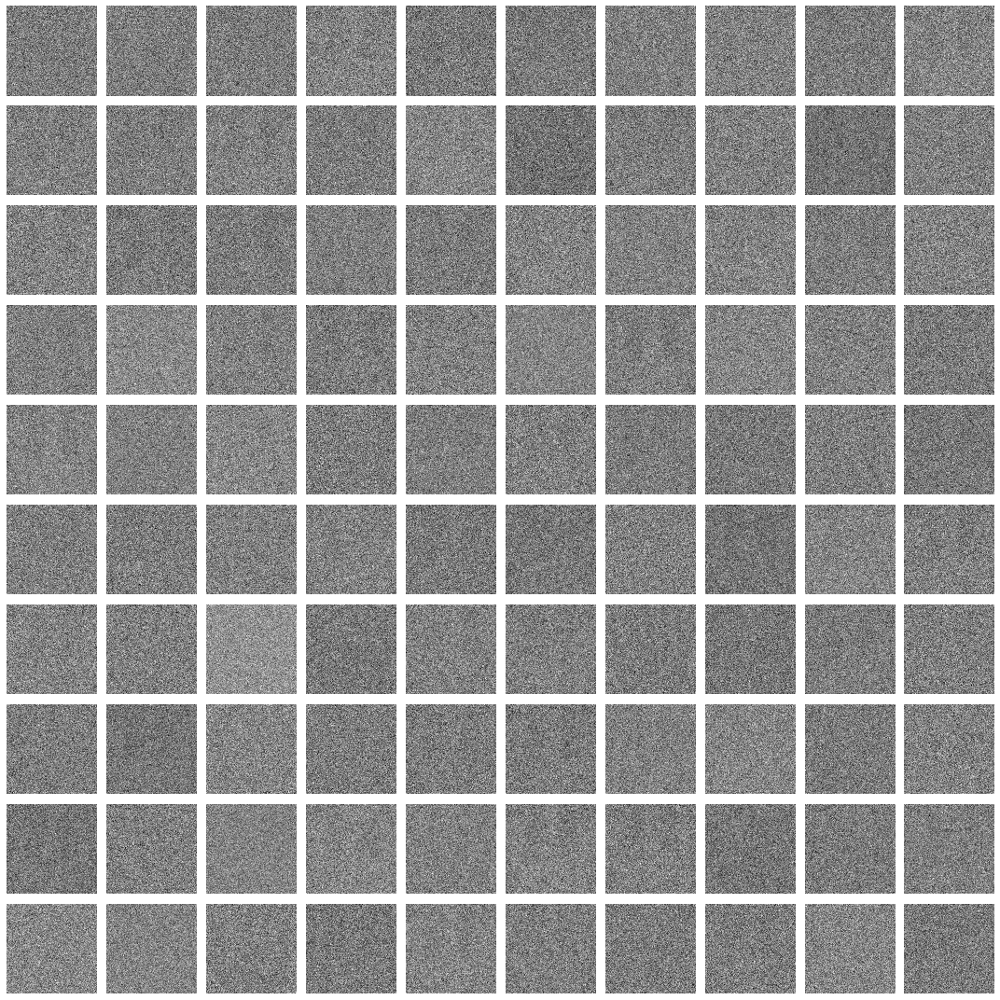

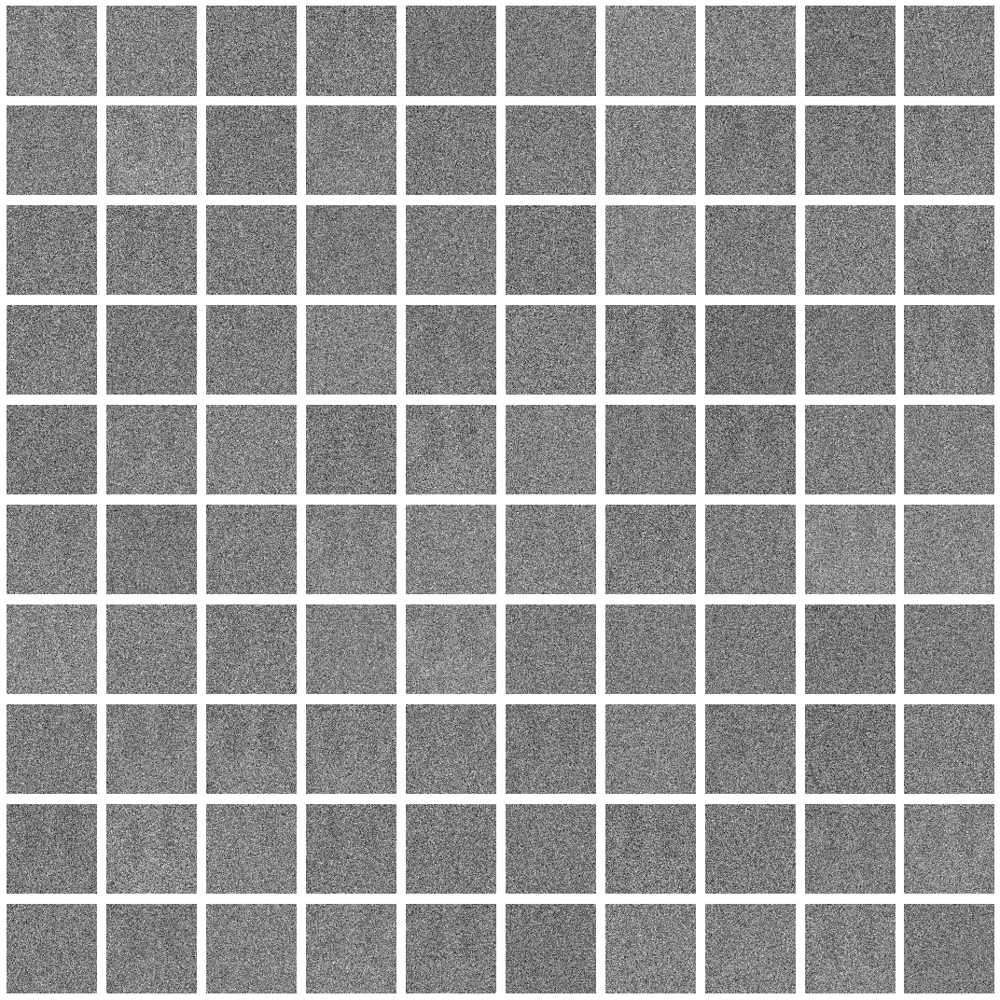

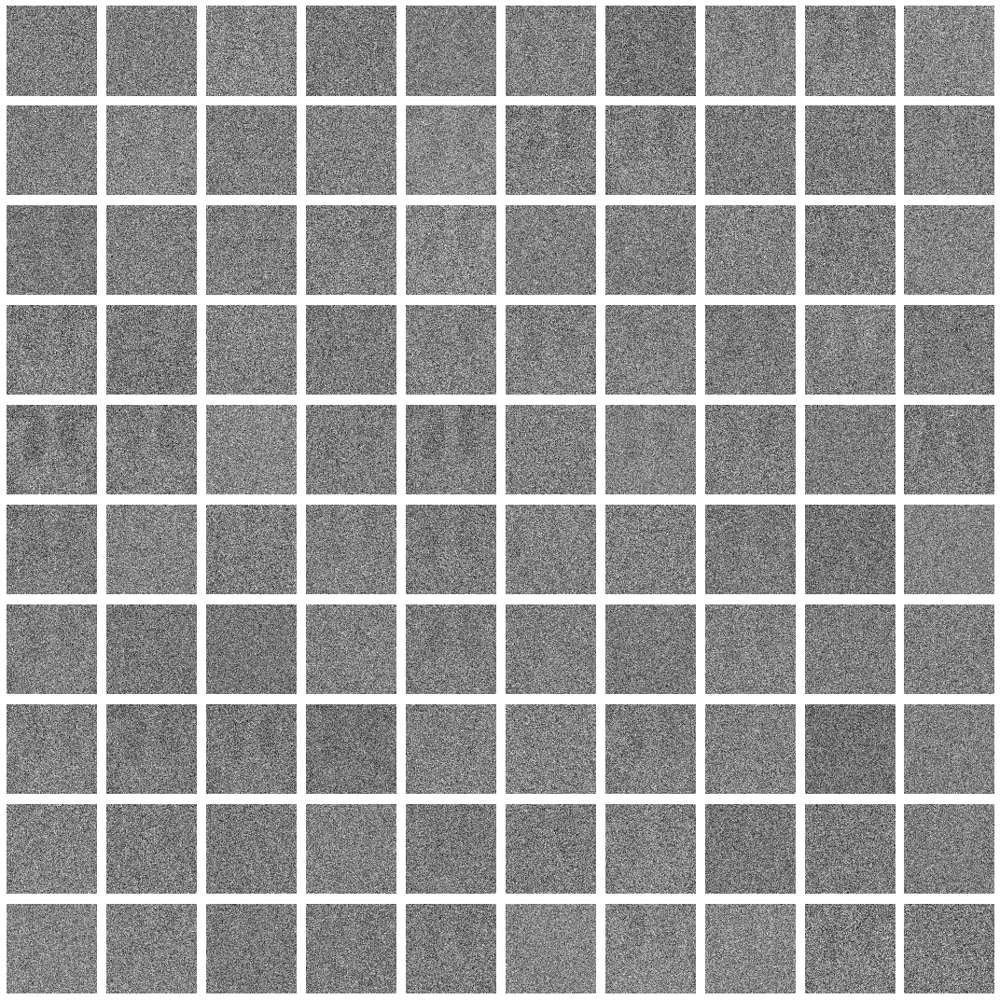

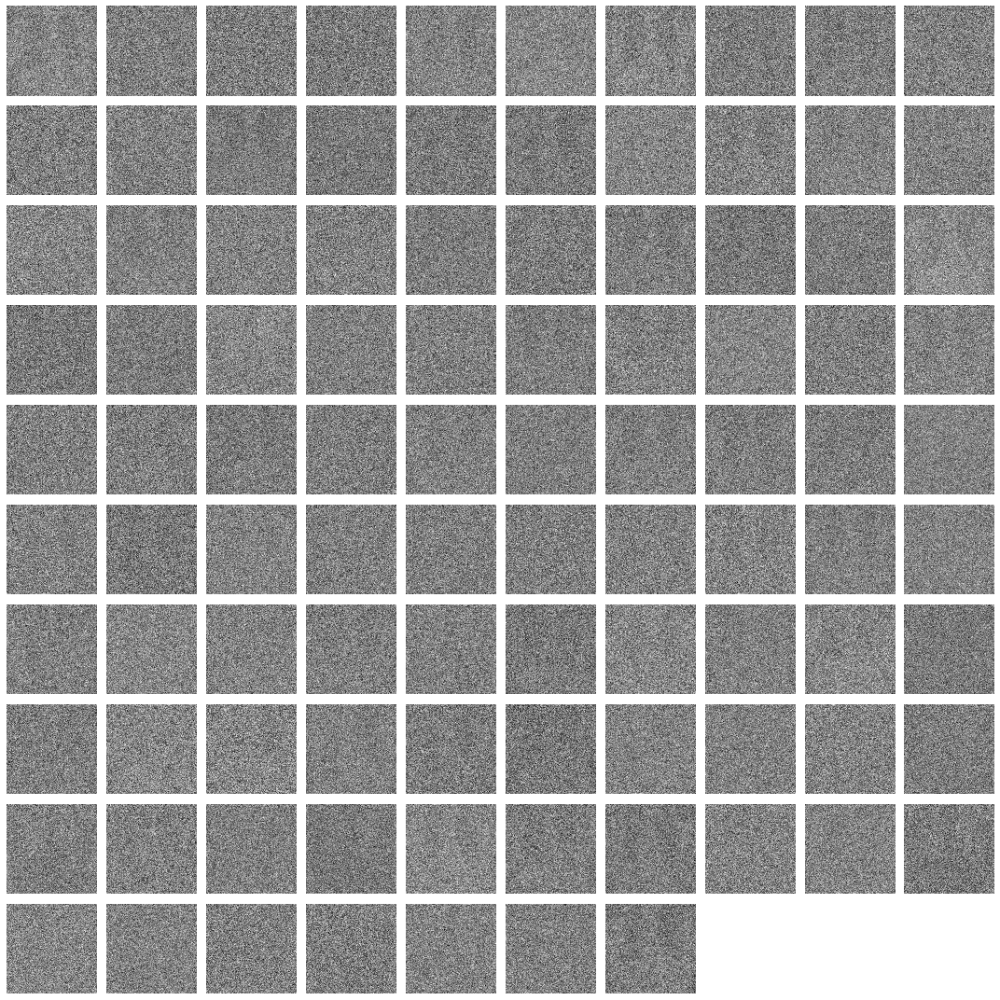

In [7]:
train(X_train, epochs = EPOCHS, batch_size = BATCH_SIZE)

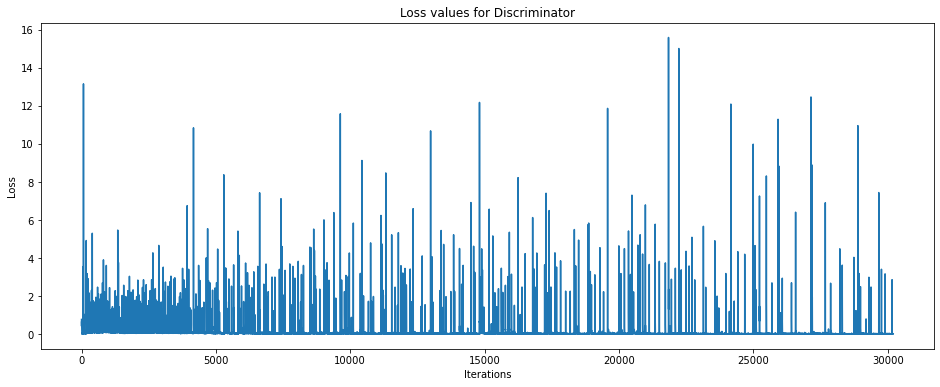

In [9]:
fig = plt.figure(figsize=(16, 6))
plt.plot(list(range(1, len(discriminator_losses) + 1)), discriminator_losses, label = 'discriminator_losses')

plt.title('Loss values for Discriminator')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

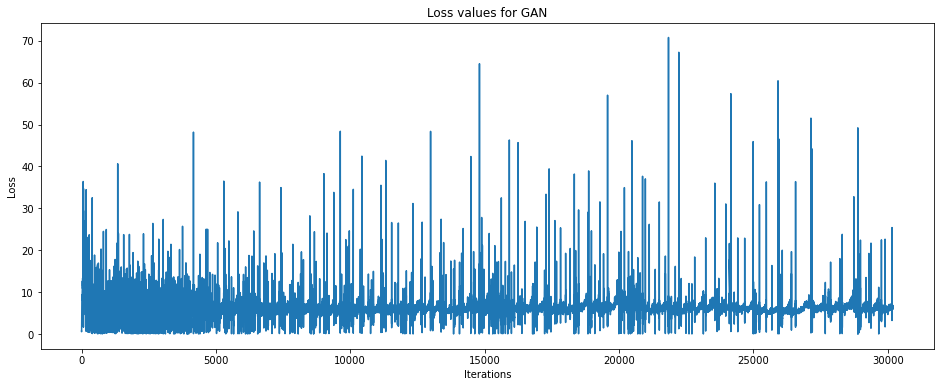

In [10]:
fig = plt.figure(figsize=(16, 6))
plt.plot(list(range(1, len(gan_losses) + 1)), gan_losses, label = 'gan_losses')

plt.title('Loss values for GAN')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()